# Evaluation

## Implementation

In [15]:
import numpy as np
from typing import Dict
from itertools import product
from sklearn.metrics import log_loss
from sklearn.metrics import accuracy_score, balanced_accuracy_score, \
    confusion_matrix, precision_recall_fscore_support, \
    roc_auc_score, matthews_corrcoef, average_precision_score, \
    log_loss, brier_score_loss
import scipy.stats.mstats as ms
from Funcs.Utility import *


def evaluate(
    y_true: np.ndarray,
    y_pred: np.ndarray,
    y_prob: np.ndarray,
    classes: np.ndarray
) -> Dict[str, any]:

    R = {}
    n_classes = len(classes)
    is_multiclass = n_classes > 2
    is_same_y = len(np.unique(y_true)) == 1
    R['inst'] = len(y_true)
    
    for c in classes:
        R[f'inst_{c}'] = np.sum(y_true == c)
        
    if not is_multiclass:
        _, cnt = np.unique(y_true, return_counts=True)
        
        if len(cnt) > 1:
            R['class_ratio'] = cnt[0] / cnt[1]
        else:
            R['class_ratio'] = np.nan

    C = confusion_matrix(y_true=y_true, y_pred=y_pred, labels=classes)
    for (i1, c1), (i2, c2) in product(enumerate(classes), enumerate(classes)):
        R[f'true_{c1}_pred_{c2}'] = C[i1, i2]

    # Threshold Measure
    R['acc'] = accuracy_score(y_true=y_true, y_pred=y_pred)
    R['bac'] = balanced_accuracy_score(y_true=y_true, y_pred=y_pred)
    R['gmean'] = ms.gmean(np.diag(C) / np.sum(C, axis=1))
    R['mcc'] = matthews_corrcoef(y_true=y_true, y_pred=y_pred)
    
    if is_multiclass:
        for avg in ('macro', 'micro'):
            pre, rec, f1, _ = precision_recall_fscore_support(
                y_true=y_true,
                y_pred=y_pred,
                labels=classes,
                average=avg, 
                zero_division=0
            )
            R[f'pre_{avg}'] = pre
            R[f'rec_{avg}'] = rec
            R[f'f1_{avg}'] = f1
    else:
        pre, rec, f1, _ = precision_recall_fscore_support(
            y_true=y_true, y_pred=y_pred, pos_label=1, average='macro', zero_division=0
        )
        R[f'pre_macro'] = pre
        R[f'rec_macro'] = rec
        R[f'f1_macro'] = f1
        
        for c in classes:
            pre, rec, f1, _ = precision_recall_fscore_support(
                y_true=y_true, y_pred=y_pred, pos_label=c, average='binary', zero_division=0
            )
            R[f'pre_{c}'] = pre
            R[f'rec_{c}'] = rec
            R[f'f1_{c}'] = f1



    # ...

    # Ranking Measure
    if is_multiclass:
        if y_prob is not None:
            for avg, mc in product(('macro', 'micro'), ('ovr', 'ovo')):
                R[f'roauc_{avg}_{mc}'] = roc_auc_score(
                    y_true=y_true, y_score=y_prob,
                    average=avg, multi_class=mc, labels=classes
                ) if not is_same_y else np.nan
        else:
            for avg, mc in product(('macro', 'micro'), ('ovr', 'ovo')):
                R[f'roauc_{avg}_{mc}'] = np.nan
    else:
        if y_prob is not None:
            R[f'roauc'] = roc_auc_score(
                y_true=y_true, y_score=y_prob[:, 1], average=None
            ) if not is_same_y else np.nan
            for i, c in enumerate(classes):
                R[f'prauc_{c}'] = average_precision_score(
                    y_true=y_true, y_score=y_prob[:, i], pos_label=c, average=None
                ) 
                R[f'prauc_ref_{c}'] = np.sum(y_true == c) / len(y_true)
        else:
            R[f'roauc'] = np.nan
            for c in classes:
                R[f'prauc_{c}'] = np.nan
                R[f'prauc_ref_{c}'] = np.nan

    # Probability Measure
    if y_prob is not None:
        R['log_loss'] = log_loss(y_true=y_true, y_pred=y_prob, labels=classes, normalize=True)
        if not is_multiclass:
            R[f'brier_loss'] = brier_score_loss(
                y_true=y_true, y_prob=y_prob[:, 1], pos_label=classes[1]
            )
    else:
        R['log_loss'] = np.nan
        if not is_multiclass:
            R[f'brier_loss'] = np.nan

    return R

## Execution

In [22]:
import os
import pandas as pd

RESULTS_EVAL = []
DIR_EVAL = os.path.join(PATH_INTERMEDIATE, 'eval')
threshold = 0.5

# Loop through the desired labels
for l in ['stress']:
    dir_l = os.path.join(DIR_EVAL, l)
    if not os.path.exists(dir_l):
        continue

    for f in os.listdir(dir_l):
        if f == '.ipynb_checkpoints':
            continue

        model, pid = f[:f.index('.pkl')].split('#')
        res = load(os.path.join(dir_l, f))
        X, y = res.X_test, res.y_test
 
        # Perform predictions for other classifiers (without datetimes)
        y_pred = res.estimator.predict(X)

        if hasattr(res.estimator, 'predict_proba'):
            y_prob = res.estimator.predict_proba(X)
        else:
            y_prob = None

        ev_test = evaluate(
            y_true=y,
            y_pred=y_pred,
            y_prob=y_prob,
            classes=[0, 1]
        )

        X, y = res.X_train, res.y_train

        # Perform predictions for other classifiers (without datetimes)
        y_pred = res.estimator.predict(X)

        if hasattr(res.estimator, 'predict_proba'):
            y_prob = res.estimator.predict_proba(X)
        else:
            y_prob = None
        
        
        ev_train = evaluate(
            y_true=y,
            y_pred=y_pred,
            y_prob=y_prob,
            classes=[0, 1]
        )

        RESULTS_EVAL.append({
            'label': l,
            'alg': model,
            'split': pid,
            'n_feature': len(X.columns),
            **{f'test_{k}': v for k, v in ev_test.items()},
            **{f'train_{k}': v for k, v in ev_train.items()}
        })

RESULTS_EVAL = pd.DataFrame(RESULTS_EVAL)
RESULTS_EVAL.head()

,label,alg,split,n_feature,test_inst,test_inst_0,test_inst_1,test_class_ratio,test_true_0_pred_0,test_true_0_pred_1,...,train_pre_1,train_rec_1,train_f1_1,train_roauc,train_prauc_0,train_prauc_ref_0,train_prauc_1,train_prauc_ref_1,train_log_loss,train_brier_loss
0,stress,xgb_os,P52,430,43,36,7,5.142857,17,19,...,0.961236,0.952581,0.956889,0.992465,0.991635,0.5,0.993061,0.5,0.110781,0.031721
1,stress,xgb_os,P69,419,76,49,27,1.814815,40,9,...,0.960534,0.957048,0.958788,0.993290,0.992079,0.5,0.994269,0.5,0.104593,0.030073
2,stress,xgb_os,P33,421,39,25,14,1.785714,21,4,...,0.955952,0.957662,0.956807,0.992803,0.990648,0.5,0.993386,0.5,0.108472,0.030044
3,stress,xgb_os,P30,421,70,57,13,4.384615,12,45,...,0.954683,0.960486,0.957576,0.992618,0.991765,0.5,0.993076,0.5,0.111160,0.031446
4,stress,xgb_os,P19,420,52,51,1,51.000000,36,15,...,0.953614,0.958813,0.956207,0.991046,0.989416,0.5,0.991863,0.5,0.114030,0.032093


In [23]:
RESULTS_xgbos = RESULTS_EVAL[RESULTS_EVAL['alg']=='xgb_os']

In [24]:
RESULTS_EVAL.columns

Index(['label', 'alg', 'split', 'n_feature', 'test_inst', 'test_inst_0',
       'test_inst_1', 'test_class_ratio', 'test_true_0_pred_0',
       'test_true_0_pred_1', 'test_true_1_pred_0', 'test_true_1_pred_1',
       'test_acc', 'test_bac', 'test_gmean', 'test_mcc', 'test_pre_macro',
       'test_rec_macro', 'test_f1_macro', 'test_pre_0', 'test_rec_0',
       'test_f1_0', 'test_pre_1', 'test_rec_1', 'test_f1_1', 'test_roauc',
       'test_prauc_0', 'test_prauc_ref_0', 'test_prauc_1', 'test_prauc_ref_1',
       'test_log_loss', 'test_brier_loss', 'train_inst', 'train_inst_0',
       'train_inst_1', 'train_class_ratio', 'train_true_0_pred_0',
       'train_true_0_pred_1', 'train_true_1_pred_0', 'train_true_1_pred_1',
       'train_acc', 'train_bac', 'train_gmean', 'train_mcc', 'train_pre_macro',
       'train_rec_macro', 'train_f1_macro', 'train_pre_0', 'train_rec_0',
       'train_f1_0', 'train_pre_1', 'train_rec_1', 'train_f1_1', 'train_roauc',
       'train_prauc_0', 'train_prauc_ref_

In [25]:
RESULTS_xgbos[['split','test_class_ratio','test_inst_0', 'test_inst_1', 'train_class_ratio','test_acc','test_bac','test_f1_macro','test_f1_1','test_roauc','test_pre_macro','test_rec_macro','test_true_0_pred_0',
       'test_true_0_pred_1', 'test_true_1_pred_0', 'test_true_1_pred_1']]

,split,test_class_ratio,test_inst_0,test_inst_1,train_class_ratio,test_acc,test_bac,test_f1_macro,test_f1_1,test_roauc,test_pre_macro,test_rec_macro,test_true_0_pred_0,test_true_0_pred_1,test_true_1_pred_0,test_true_1_pred_1
0,P52,5.142857,36,7,1.0,0.488372,0.521825,0.436905,0.266667,0.551587,0.511957,0.521825,17,19,3,4
1,P69,1.814815,49,27,1.0,0.618421,0.537793,0.529763,0.325581,0.541194,0.552083,0.537793,40,9,20,7
2,P33,1.785714,25,14,1.0,0.589744,0.491429,0.462069,0.200000,0.588571,0.484848,0.491429,21,4,12,2
3,P30,4.384615,57,13,1.0,0.242857,0.297571,0.235209,0.158730,0.249663,0.350000,0.297571,12,45,8,5
4,P19,51.000000,51,1,1.0,0.711538,0.852941,0.472617,0.117647,0.725490,0.531250,0.852941,36,15,0,1
5,P48,0.947368,18,19,1.0,0.621622,0.627193,0.607576,0.533333,0.628655,0.652098,0.627193,15,3,11,8
6,P61,2.476190,52,21,1.0,0.616438,0.659799,0.603876,0.533333,0.672161,0.631599,0.659799,29,23,5,16
7,P15,3.333333,30,9,1.0,0.666667,0.472222,0.463492,0.133333,0.585185,0.462121,0.472222,25,5,8,1
8,P08,0.437500,21,48,1.0,0.333333,0.467262,0.315948,0.206897,0.387897,0.444068,0.467262,17,4,42,6
9,P26,4.066667,61,15,1.0,0.592105,0.645355,0.550982,0.415094,0.687432,0.592105,0.645355,34,27,4,11


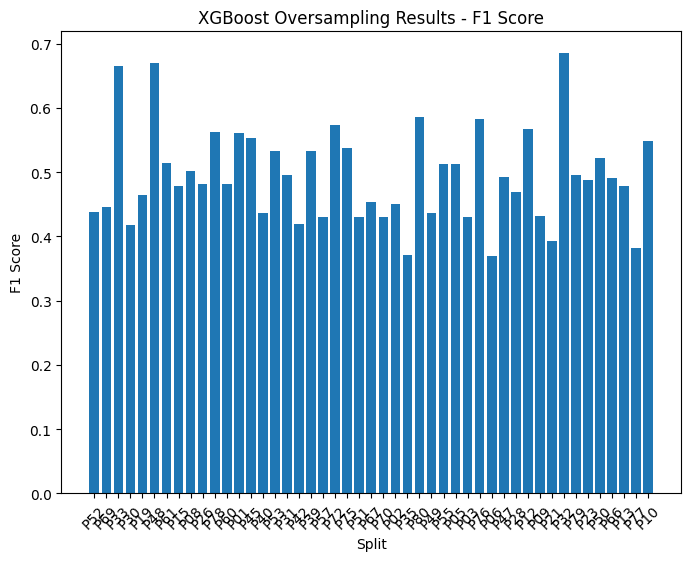

In [20]:
import matplotlib.pyplot as plt

# Extract the relevant columns from the results dataframe
f1_score = RESULTS_xgbos['test_f1_macro']
split_names = RESULTS_xgbos['split']

# Plotting the bar chart
plt.figure(figsize=(8, 6))
plt.bar(split_names, f1_score)
plt.xlabel('Split')
plt.ylabel('F1 Score')
plt.title('XGBoost Oversampling Results - F1 Score')
plt.xticks(rotation=45)
plt.show()


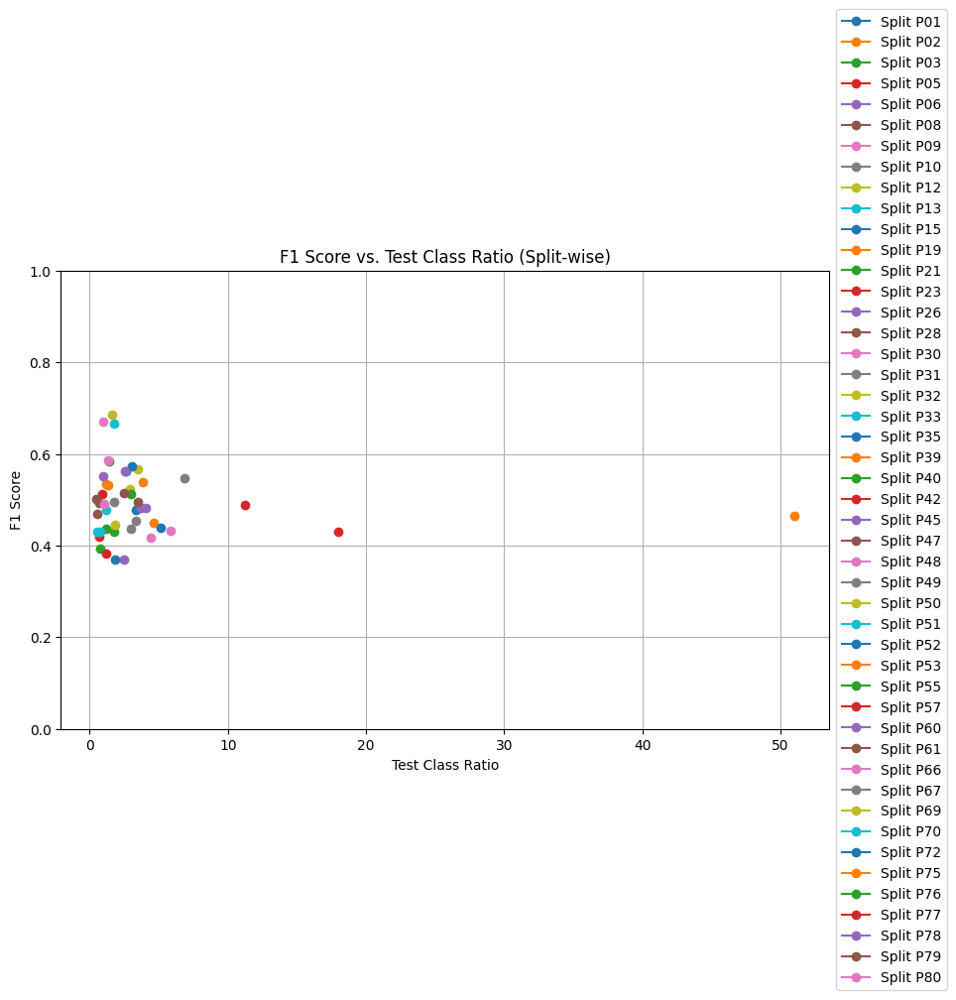

In [21]:
import matplotlib.pyplot as plt

# Group the results dataframe by split (user)
grouped_results = RESULTS_xgbos.groupby('split')

# Plot the F1 scores for each split
plt.figure(figsize=(10, 6))
for split, group in grouped_results:
    test_class_ratio = group['test_class_ratio']
    test_f1_macro = group['test_f1_macro']
    plt.plot(test_class_ratio, test_f1_macro, marker='o', label=f'Split {split}')
plt.xlabel('Test Class Ratio')
plt.ylabel('F1 Score')
plt.title('F1 Score vs. Test Class Ratio (Split-wise)')
plt.grid(True)

# Set the y-axis range from 0 to 1
plt.ylim(0, 1)

# Place the legend to the right of the plot
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()


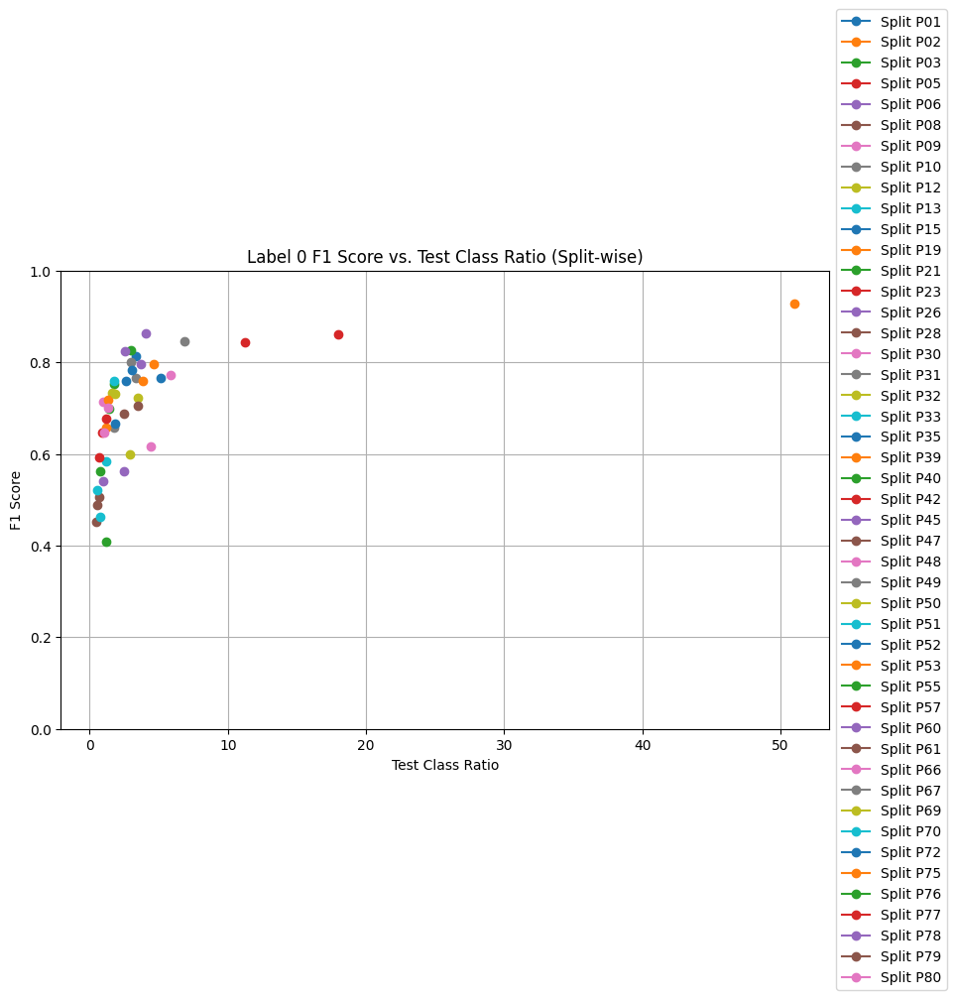

In [22]:
import matplotlib.pyplot as plt

# Group the results dataframe by split (user)
grouped_results = RESULTS_xgbos.groupby('split')

# Plot the F1 scores for each split
plt.figure(figsize=(10, 6))
for split, group in grouped_results:
    test_class_ratio = group['test_class_ratio']
    test_f1_macro = group['test_f1_0']
    plt.plot(test_class_ratio, test_f1_macro, marker='o', label=f'Split {split}')
plt.xlabel('Test Class Ratio')
plt.ylabel('F1 Score')
plt.title('Label 0 F1 Score vs. Test Class Ratio (Split-wise)')
plt.grid(True)

# Set the y-axis range from 0 to 1
plt.ylim(0, 1)

# Place the legend to the right of the plot
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()


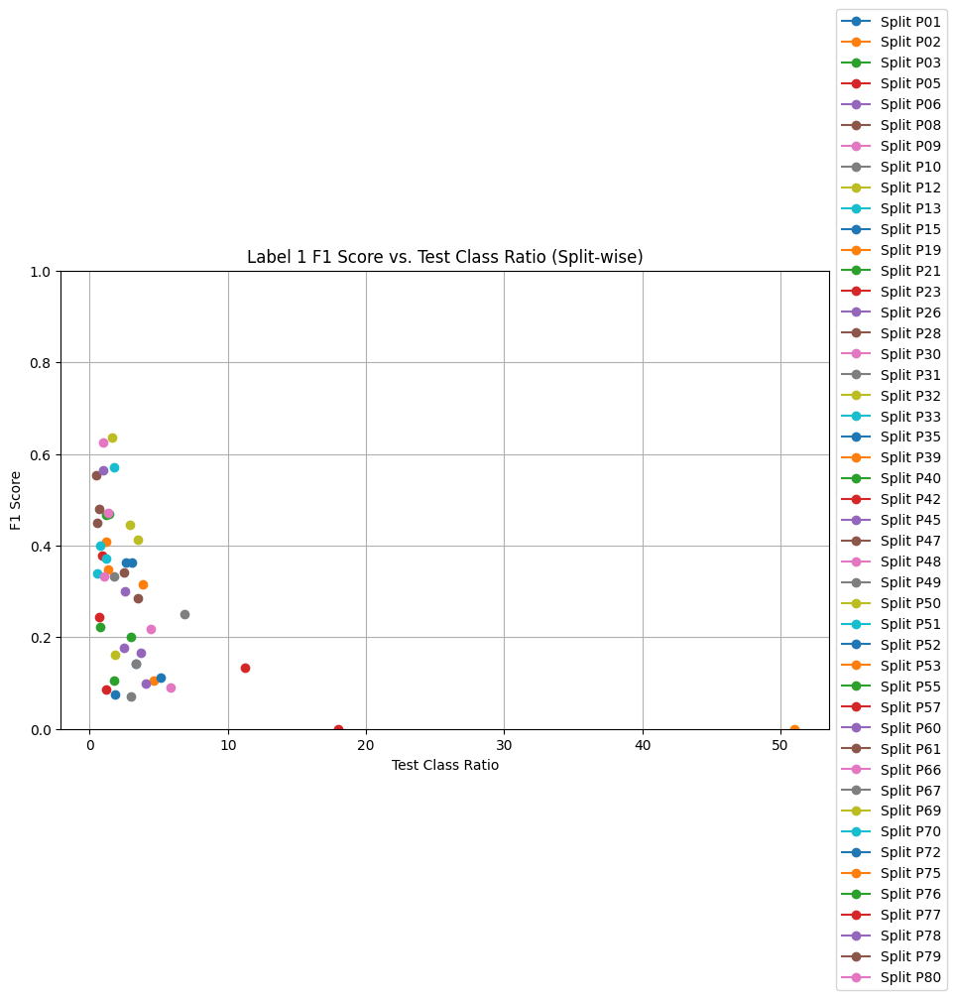

In [23]:
import matplotlib.pyplot as plt

# Group the results dataframe by split (user)
grouped_results = RESULTS_xgbos.groupby('split')

# Plot the F1 scores for each split
plt.figure(figsize=(10, 6))
for split, group in grouped_results:
    test_class_ratio = group['test_class_ratio']
    test_f1_macro = group['test_f1_1']
    plt.plot(test_class_ratio, test_f1_macro, marker='o', label=f'Split {split}')
plt.xlabel('Test Class Ratio')
plt.ylabel('F1 Score')
plt.title('Label 1 F1 Score vs. Test Class Ratio (Split-wise)')
plt.grid(True)

# Set the y-axis range from 0 to 1
plt.ylim(0, 1)

# Place the legend to the right of the plot
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()



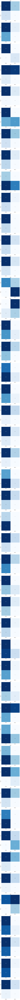

In [24]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

# Assuming `df` is your DataFrame
df_confusion_matrix = RESULTS_xgbos[['split', 'test_true_0_pred_0',
       'test_true_0_pred_1', 'test_true_1_pred_0', 'test_true_1_pred_1']].set_index('split')

fig, axes = plt.subplots(df_confusion_matrix.shape[0], figsize=(5, df_confusion_matrix.shape[0]*5))

for ax, (index, row) in zip(axes.flat, df_confusion_matrix.iterrows()):
    cm = np.array(row).reshape((2,2))
    sns.heatmap(cm, annot=True, fmt='.0f', ax=ax, cmap='Blues', cbar=False,
                xticklabels=['Pred 0', 'Pred 1'], yticklabels=['True 0', 'True 1'])
    ax.set_title(index)

plt.tight_layout()
plt.show()

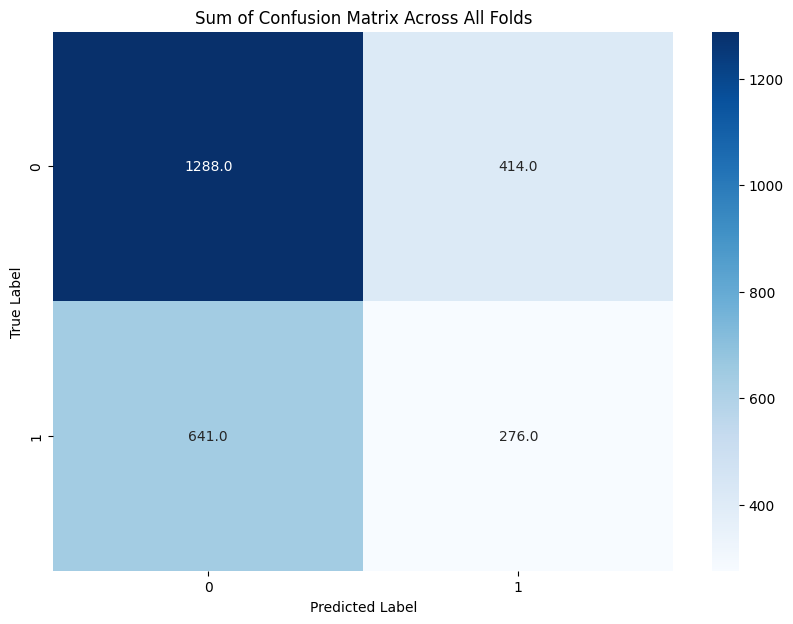

In [25]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

# Assuming `df` is your DataFrame
df_confusion_matrix = RESULTS_xgbos[['split', 'test_true_0_pred_0',
       'test_true_0_pred_1', 'test_true_1_pred_0', 'test_true_1_pred_1']].set_index('split')

# Calculate the mean of confusion matrix values across all folds
mean_confusion_matrix = df_confusion_matrix.sum()

# Convert the mean values into a 2x2 confusion matrix
matrix = mean_confusion_matrix.values.reshape(2, 2)

# Plot the averaged confusion matrix
plt.figure(figsize=(10, 7))
sns.heatmap(matrix, annot=True, fmt=".1f", cmap='Blues')
plt.title("Sum of Confusion Matrix Across All Folds")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

In [26]:
import pandas as pd


SUMMARY_EVAL = []

for row in RESULTS_EVAL.groupby(
#    ['label', 'alg', 'cluster']
     ['label', 'alg']
).agg(summary).reset_index().itertuples():
    for k, v in row._asdict().items():
        if type(v) is dict:
            r = dict(
                label=row.label,
                alg=row.alg,
#                 cluster = row.cluster,
                metric=k,
                **v
            )
            SUMMARY_EVAL.append(r)

SUMMARY_EVAL = pd.DataFrame(SUMMARY_EVAL)    
SUMMARY_EVAL.head()

,label,alg,metric,n,cardinality,value_count,sum,mean,SD,med,range,conf.,nan_count
0,stress,xgb_os,split,47,47.0,"P52:1, P28:1, P35:1, P80:1, P49:1, P55:1, P05:...",NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,stress,xgb_os,n_feature,47,NaN,NaN,19721.0,419.595745,5.383790,419.0,"(410, 432)","(418.01500460861365, 421.17648475308846)",0.0
2,stress,xgb_os,test_inst,47,NaN,NaN,2619.0,55.723404,13.076202,52.0,"(36, 83)","(51.88408763344431, 59.56272087719398)",0.0
3,stress,xgb_os,test_inst_0,47,NaN,NaN,1702.0,36.212766,11.939952,33.0,"(16, 61)","(32.707064866352056, 39.718467048541555)",0.0
4,stress,xgb_os,test_inst_1,47,NaN,NaN,917.0,19.510638,11.795121,18.0,"(1, 55)","(16.04746097723458, 22.973815618510102)",0.0


In [27]:
SUB_SUMMARY_EVAL = SUMMARY_EVAL.loc[
    lambda x: x['metric'].isin(
        ['n_feature','test_acc' ,'test_f1_1',  'test_f1_macro','test_roauc','test_pre_macro','test_rec_macro']
    )
].round(3).assign(
    mean_sd=lambda x: x['mean'].astype(str).str.cat(' (' + x['SD'].astype(str) + ')', sep=''),
).pivot(
    index=['label', 'alg'], columns=['metric'], values=['mean_sd']
)

# separate rows where 'alg' is 'dummy' and 'alg' is not 'dummy'
df_dummy = SUB_SUMMARY_EVAL[SUB_SUMMARY_EVAL.index.get_level_values('alg') == 'dummy']
df_others = SUB_SUMMARY_EVAL[SUB_SUMMARY_EVAL.index.get_level_values('alg') != 'dummy']

# concatenate them ensuring that 'dummy' rows are always at the top for each group
SUB_SUMMARY_EVAL = pd.concat([df_dummy, df_others])

SUB_SUMMARY_EVAL

mean_sd                                               \
metric               n_feature       test_acc      test_f1_1  test_f1_macro   
label  alg                                                                    
stress xgb_os  419.596 (5.384)  0.545 (0.104)  0.322 (0.155)  0.477 (0.092)   

                                                           
metric        test_pre_macro test_rec_macro    test_roauc  
label  alg                                                 
stress xgb_os  0.522 (0.081)    0.521 (0.1)  0.54 (0.111)

# Feature Importances (Tree Feature Importance)

## Implementation

In [1]:
from typing import Union, Optional


def feature_importance(
    estimator
):
    if not hasattr(estimator, 'feature_names_in_') or not hasattr(estimator, 'feature_importances_'):
        return None
    
    names = estimator.feature_names_in_
    importances = estimator.feature_importances_
    
    return names, importances

## Execution

In [3]:
import os
import pandas as pd
from collections import defaultdict
from Funcs.Utility import *


IMPORTANCE_EVAL = defaultdict(list)
DIR_EVAL = os.path.join(PATH_INTERMEDIATE, 'eval')

# for l in ['valence', 'arousal', 'disturbance', 'stress']:
for l in ['stress']:
    dir_l = os.path.join(DIR_EVAL, l)
    if not os.path.exists(dir_l):
        continue
    
    for f in os.listdir(dir_l):
        if f!='.ipynb_checkpoints':
            res = load(os.path.join(dir_l, f))

            f_norm = f[:f.index('.pkl')]
            alg = f_norm[:f.rindex('#')]

            feat_imp = feature_importance(res.estimator)
            if not feat_imp:
                continue

            names, importance = feat_imp
            new_names = []
            for n in names:
                for c in res.categories:
                    n = n.replace(f'{c}_', f'{c}=')
                new_names.append(n)

            d = pd.DataFrame(
                importance.reshape(1, -1),
                columns=new_names
            )
            IMPORTANCE_EVAL[(l, alg)].append(d)
        

IMPORTANCE_SUMMARY = []

for (l, alg), v in IMPORTANCE_EVAL.items():
    new_v = pd.concat(
        v, axis=0
    ).fillna(0.0).mean().reset_index().set_axis(
        ['feature', 'importance'], axis=1
    ).assign(
        label=l,
        alg=alg
    )
    IMPORTANCE_SUMMARY.append(new_v)
    
IMPORTANCE_SUMMARY = pd.concat(IMPORTANCE_SUMMARY, axis=0, ignore_index=True)

### Plot

In [4]:
%load_ext rpy2.ipython

In [5]:
%%R

library(tidyverse)
library(ggforce)
library(ggpubr)
library(showtext)
library(rmcorr)
library(patchwork)

THEME_DEFAULT <- theme_bw(
    base_size=10
) + theme(
        axis.title.x=element_text(colour='grey20', size=10, face='bold'),
        axis.title.y=element_text(colour='grey20', size=10, face='bold'),
        axis.text.x=element_text(colour='grey20', size=10),
        axis.text.y=element_text(colour='grey20', size=10),
        strip.text.x=element_text(colour='grey20', size=10, face='bold'),
        strip.text.y=element_text(colour='grey20', size=10, face='bold'),
        legend.background=element_blank(),
        legend.title=element_text(colour='grey20', size=10, face='bold'),
        legend.text=element_text(colour='grey20', size=10),
        legend.position='top',
        legend.box.spacing= unit(0, 'cm'),
        plot.subtitle=element_text(colour='grey20', size=10, hjust=.5)
    )


── Attaching packages ─────────────────────────────────────── tidyverse 1.3.2 ──
✔ ggplot2 3.4.0      ✔ purrr   1.0.0 
✔ tibble  3.1.8      ✔ dplyr   1.0.10
✔ tidyr   1.2.1      ✔ stringr 1.5.0 
✔ readr   2.1.3      ✔ forcats 0.5.2 
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()


R[write to console]: Loading required package: sysfonts

R[write to console]: Loading required package: showtextdb



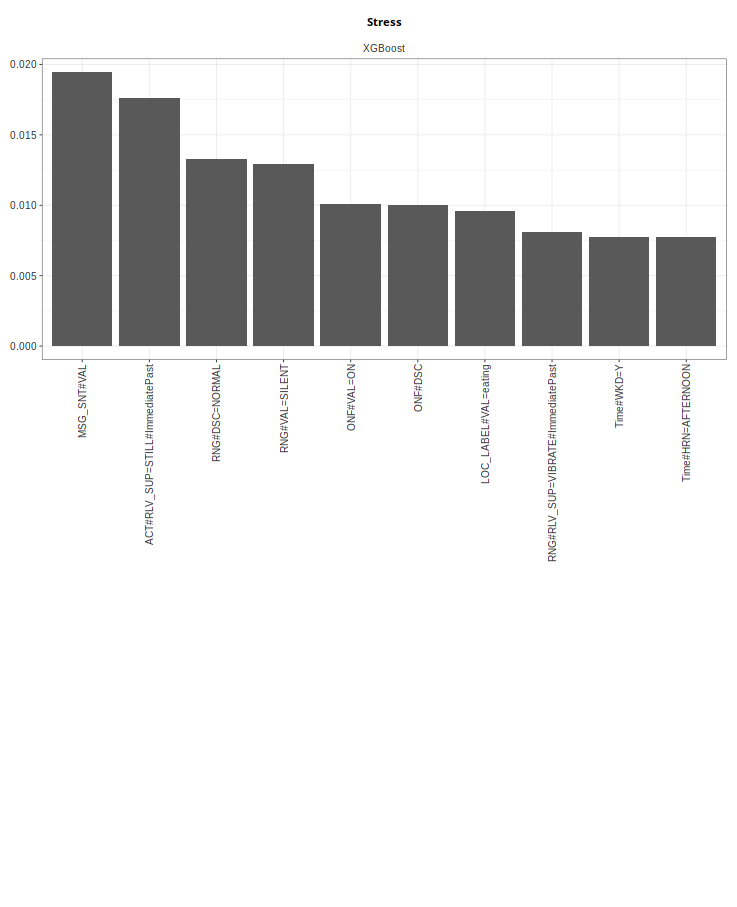

In [8]:
%%R -i IMPORTANCE_SUMMARY -w 26 -h 32 -u cm

plots <- list()

#for (l in c('valence', 'arousal', 'stress', 'disturbance')) {
for (l in c( 'stress')) {
    data <- IMPORTANCE_SUMMARY %>% filter(
        (label == l)
    )

    p_label <- ggplot() + geom_text(
        aes(x=.5, y=.5),
        label=str_to_title(l), 
        family='ssp', 
        fontface='bold',
        size=4
    ) + theme_void()

#     p_rf <- ggplot(
#         data %>% filter(alg == 'rf_os') %>% top_n(n=10, wt=importance),
#         aes(x=reorder(feature, -importance), y=importance),
#     ) + geom_col(
#     ) + THEME_DEFAULT + theme(
#         axis.text.x=element_text(angle=90, size=10, hjust=1, vjust=.5),
#         axis.title.x=element_blank(),
#         axis.title.y=element_blank()
#     ) + labs(
#         subtitle='Random Forest'
#     )
    
    p_xgb <- ggplot(
        data %>% filter(alg == 'xgb_os') %>% top_n(n=10, wt=importance),
        aes(x=reorder(feature, -importance), y=importance),
    ) + geom_col(
    ) + THEME_DEFAULT + theme(
        axis.text.x=element_text(angle=90, size=10, hjust=1, vjust=.5),
        axis.title.x=element_blank(),
        axis.title.y=element_blank()
    ) + labs(
        subtitle='XGBoost'
    )
    
    plots[[paste(l, 'label', sep='_')]] <- p_label
#     plots[[paste(l, 'rf', sep='_')]] <- p_rf
    plots[[paste(l, 'xgb', sep='_')]] <- p_xgb
}

#p <- plots$arousal_label + plots$valence_label
#p <- p / (plots$arousal_rf | plots$arousal_xgb | plots$valence_rf | plots$valence_xgb)
#p <- p / (plots$stress_label + plots$disturbance_label)
#p <- p / (plots$stress_rf | plots$stress_xgb | plots$disturbance_rf | plots$disturbance_xgb)
p <- plots$stress_label 
# p <- p / (plots$stress_rf | plots$stress_xgb)
p <- p / (plots$stress_xgb)

p <- p + plot_layout(
    heights=c(1.1, 10, 1.1, 10)
)

ggsave(paste('./fig/imp.pdf'), plot=p, width=26, height=32, unit='cm', device=cairo_pdf)
print(p)


# Feature Importances (Shap)

In [9]:
from sklearn.dummy import DummyClassifier
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
import shap

def feature_importance_shap(estimator, X):
    explainer = None
    # Check if the estimator is an instance of RandomForest
    if isinstance(estimator, RandomForestClassifier):
        explainer = shap.Explainer(estimator)
    elif isinstance(estimator, DummyClassifier):
        return None
    elif isinstance(estimator.model, XGBClassifier):
        # Pass the inner model to the explainer
        explainer = shap.Explainer(estimator.model)
    else:
        print("Estimator not supported:", type(estimator))
        return None

    shap_values = explainer.shap_values(X)
    if isinstance(shap_values, list): # Handling for binary classification in RandomForest
        shap_values = shap_values[1]
    names = X.columns if hasattr(estimator, 'feature_names_in_') else None # get feature names from the model itself
    return names, np.abs(shap_values).mean(axis=0)

In [10]:
import os
import pandas as pd
from collections import defaultdict
import ray

with on_ray():
    IMPORTANCE_EVAL = defaultdict(list)
    DIR_EVAL = os.path.join(PATH_INTERMEDIATE, 'eval')

    @ray.remote
    def process_file(file_path, dir_l):
        res = load(os.path.join(dir_l, file_path))

        f_norm = file_path[:file_path.index('.pkl')]
        fold = f_norm[f_norm.rindex('#')+1:]
        alg = f_norm[:file_path.rindex('#')]

        feat_imp = feature_importance_shap(res.estimator, res.X_test)
        if not feat_imp:
            return None

        names, importance = feat_imp
        new_names = []
        for n in names:
            for c in res.categories:
                n = n.replace(f'{c}_', f'{c}=')
            new_names.append(n)

        d = pd.DataFrame(
            importance.reshape(1, -1),
            columns=new_names
        )
        return (l, fold, alg, d)


    file_tasks = []
    for l in ['stress']:
        dir_l = os.path.join(DIR_EVAL, l)
        if not os.path.exists(dir_l):
            continue

        for f in os.listdir(dir_l):
            if f != '.ipynb_checkpoints':
                file_tasks.append(process_file.remote(f, dir_l))

    IMPORTANCE_SUMMARY = []
    results = ray.get(file_tasks)
    for result in results:
        if result is not None:
            l, fold, alg, d = result
            IMPORTANCE_EVAL[(l, fold, alg)].append(d)

    for (l, fold, alg), v in IMPORTANCE_EVAL.items():
        new_v = pd.concat(
            v, axis=0
        ).fillna(0.0).mean().reset_index().set_axis(
            ['feature', 'importance'], axis=1
        ).assign(
            label=l,
            fold=fold,
            alg=alg
        )
        IMPORTANCE_SUMMARY.append(new_v)

    IMPORTANCE_SUMMARY = pd.concat(IMPORTANCE_SUMMARY, axis=0, ignore_index=True)


2023-08-17 15:21:14,994	INFO worker.py:1452 -- Connecting to existing Ray cluster at address: 192.168.1.28:6379...
2023-08-17 15:21:15,034	INFO worker.py:1627 -- Connected to Ray cluster. View the dashboard at 127.0.0.1:8265 
(pid=188446, ip=192.168.1.27) /home/panyu/miniconda3/envs/sci-data/lib/python3.9/site-packages/shap/utils/_clustering.py:35: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
(pid=188446, ip=192.168.1.27)   def _pt_shuffle_rec(i, indexes, index_mask, partition_tree, M, pos):
(pid=188446, ip=192.168.1.27) /home/panyu/miniconda3/envs/sci-data/lib/python3.9/site-packages/shap/utils/_clustering.py:54: NumbaDeprecationWarning: The 'nopython' keyword argument was 

(process_file pid=188448, ip=192.168.1.27) ntree_limit is deprecated, use `iteration_range` or model slicing instead.
(pid=188726, ip=192.168.1.27) /home/panyu/miniconda3/envs/sci-data/lib/python3.9/site-packages/shap/explainers/_partition.py:676: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details. [repeated 187x across cluster] (Ray deduplicates logs by default. Set RAY_DEDUP_LOGS=0 to disable log deduplication, or see https://docs.ray.io/en/master/ray-observability/ray-logging.html#log-deduplication for more options.)
(pid=188726, ip=192.168.1.27)   def _pt_shuffle_rec(i, indexes, index_mask, partition_tree, M, pos): [repeated 11x across cluster]
(pid=188726, ip=192.168.1.27)   d

In [11]:
IMPORTANCE_SUMMARY_xgb_os = IMPORTANCE_SUMMARY[IMPORTANCE_SUMMARY['alg'] =='xgb_os']

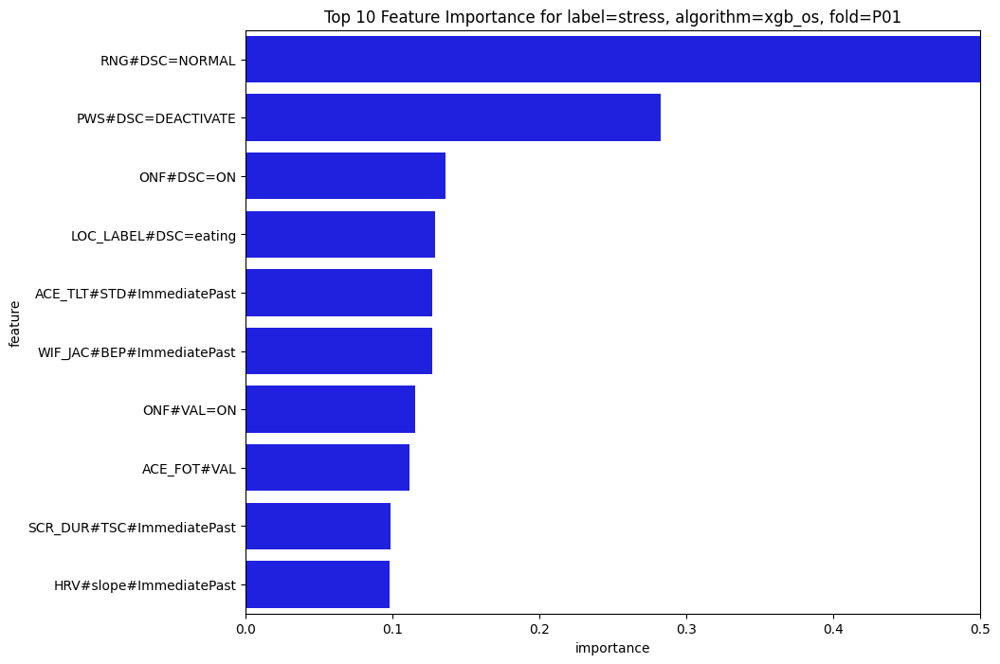

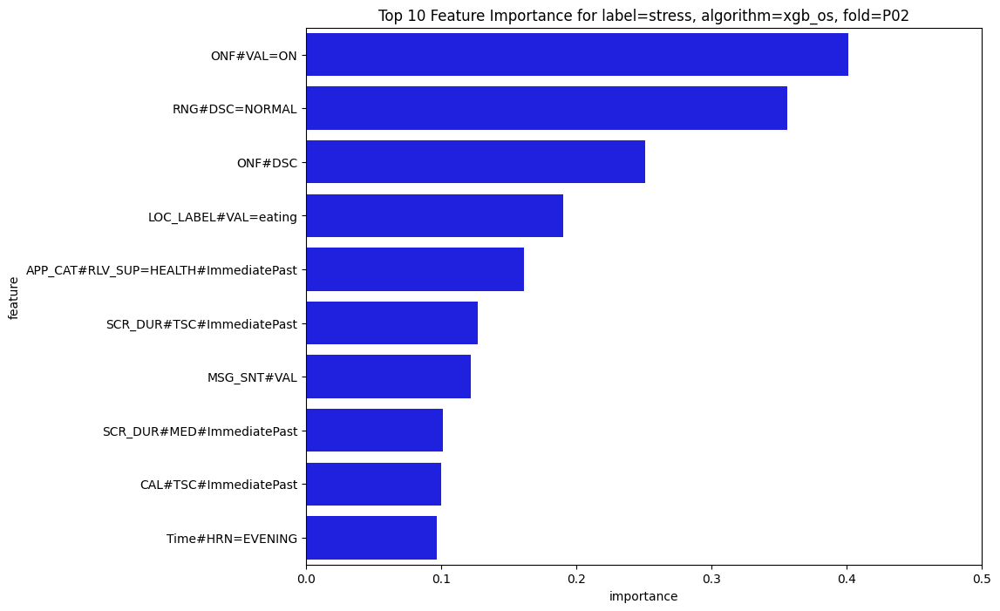

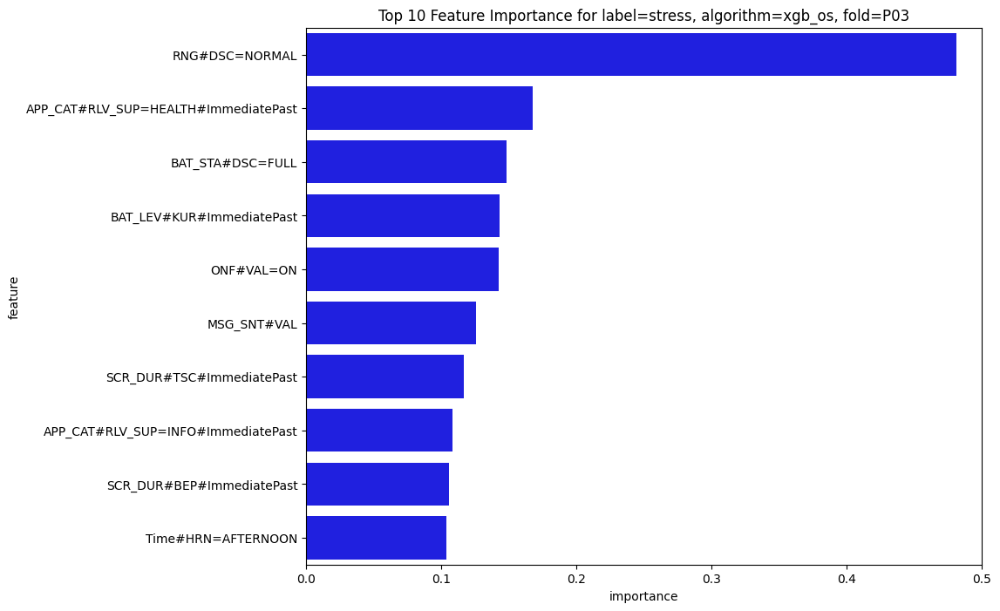

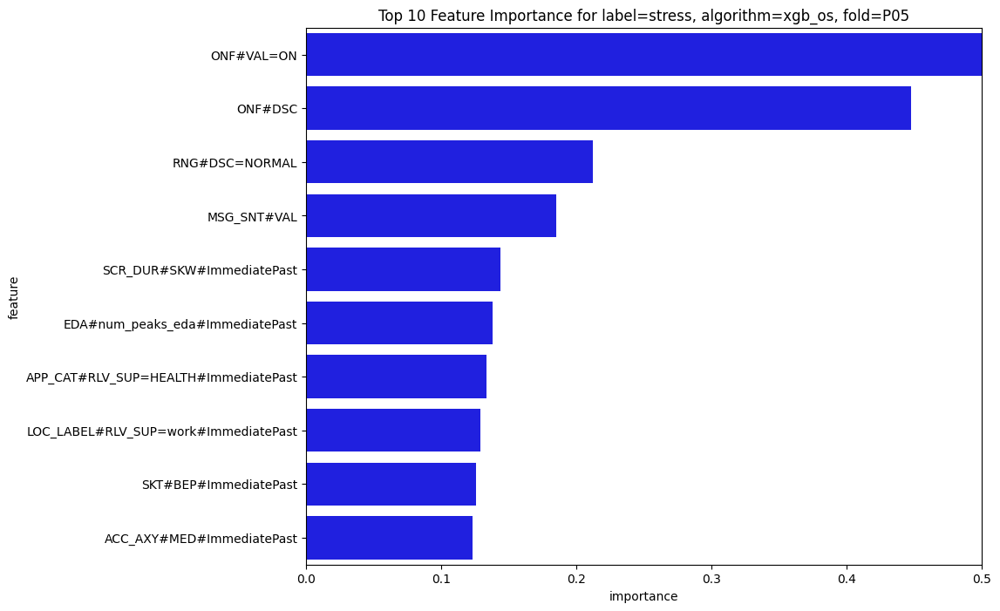

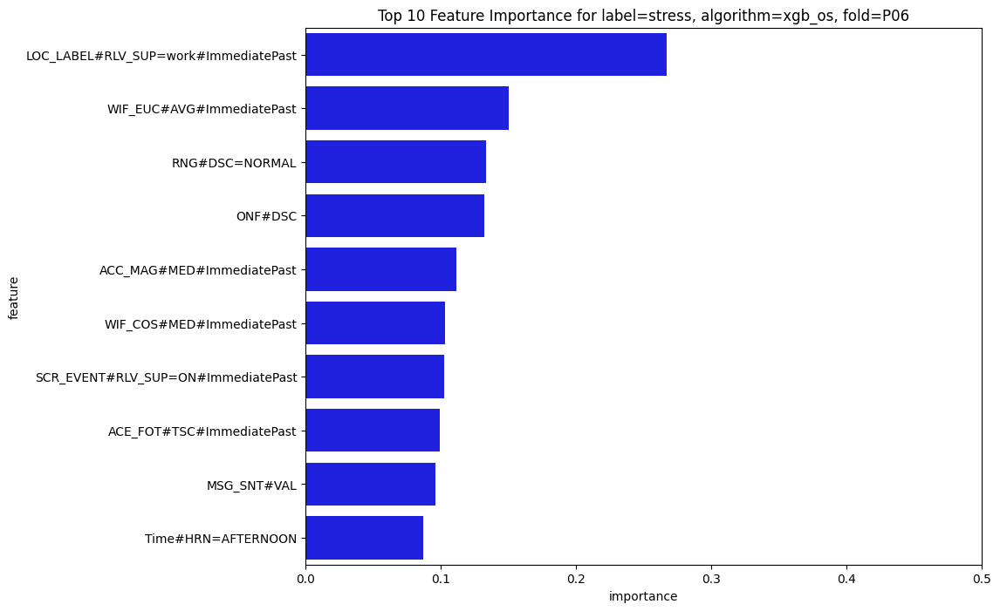

...

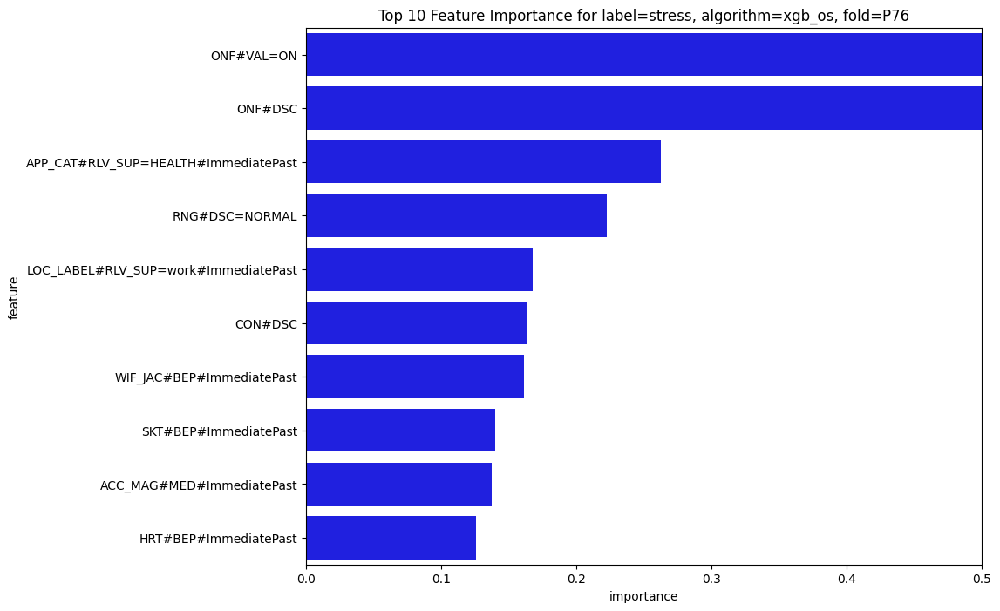

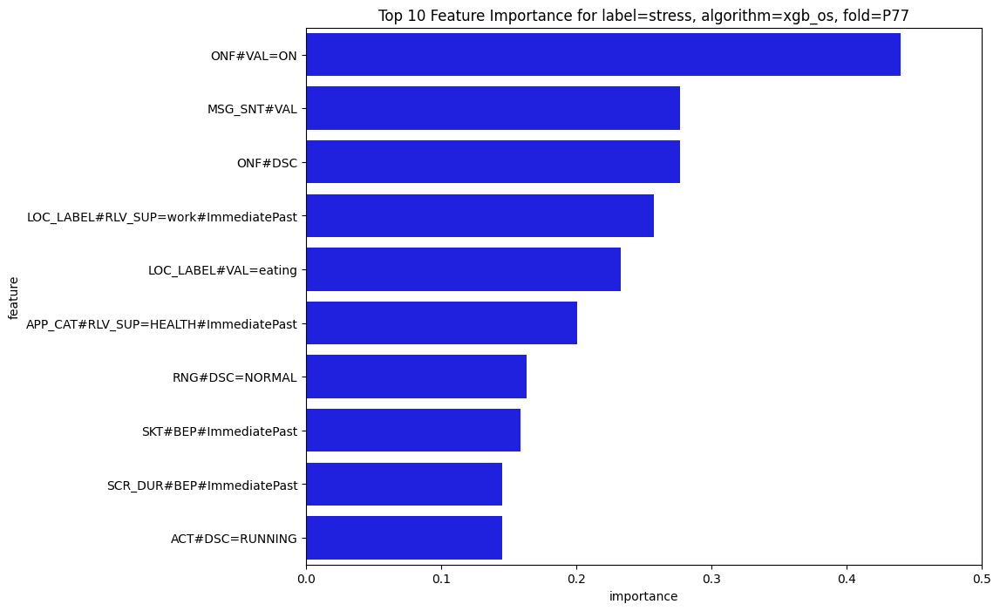

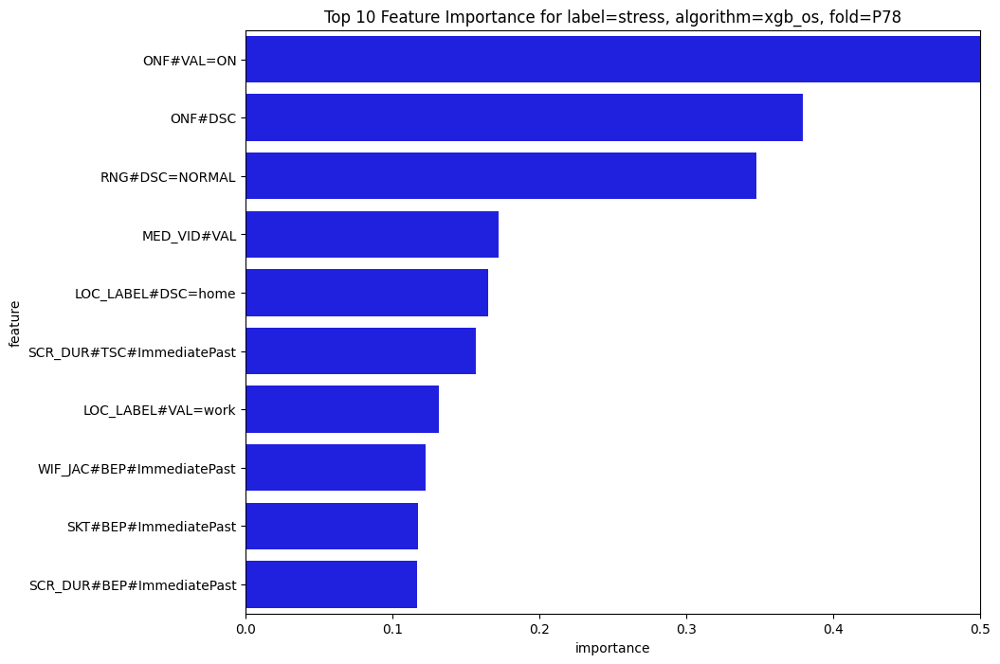

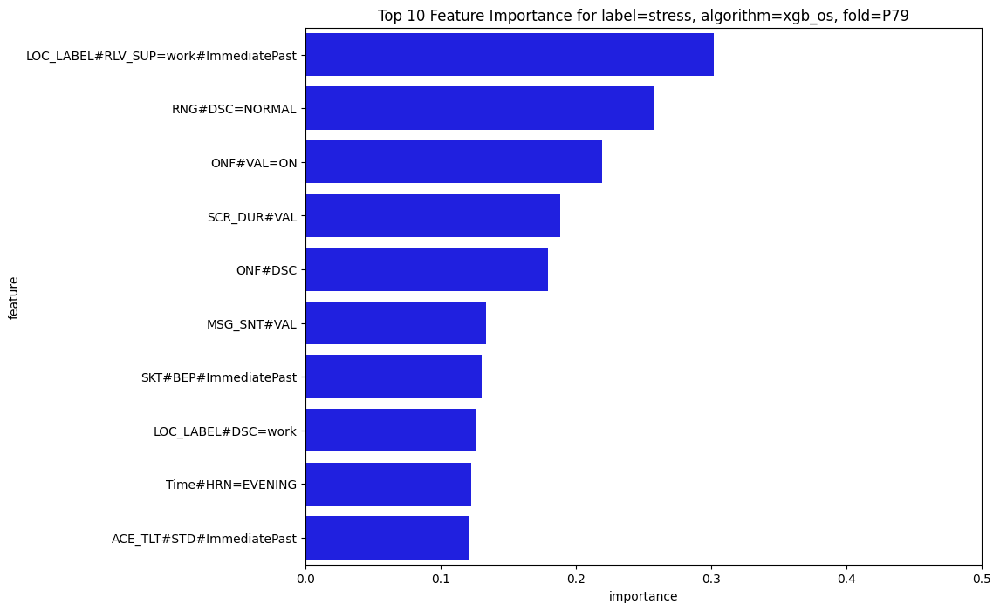

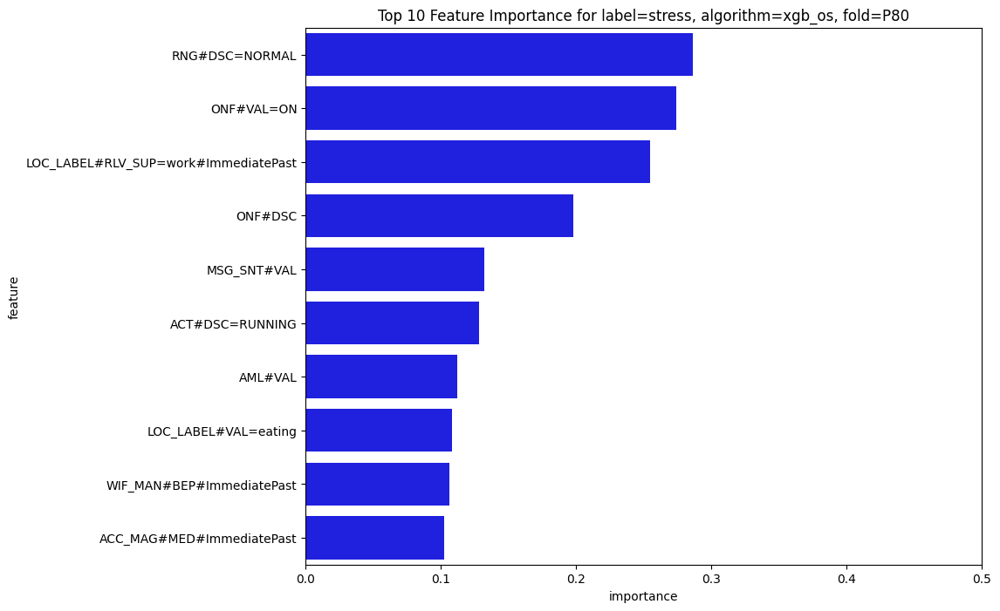

In [12]:
import seaborn as sns
import matplotlib.pyplot as plt

# Create a plot for each label, algorithm, and fold
for (l, alg, fold), df in IMPORTANCE_SUMMARY_xgb_os.groupby(['label', 'alg', 'fold']):
    # Get top 10 features
    df_top10 = df.dropna().sort_values(by='importance', ascending=False).head(10)
    plt.figure(figsize=(10,8))
    sns.barplot(data=df_top10, x='importance', y='feature', color='b')
    plt.title(f'Top 10 Feature Importance for label={l}, algorithm={alg}, fold={fold}')
    plt.xlim([0, 0.5])
    plt.show()

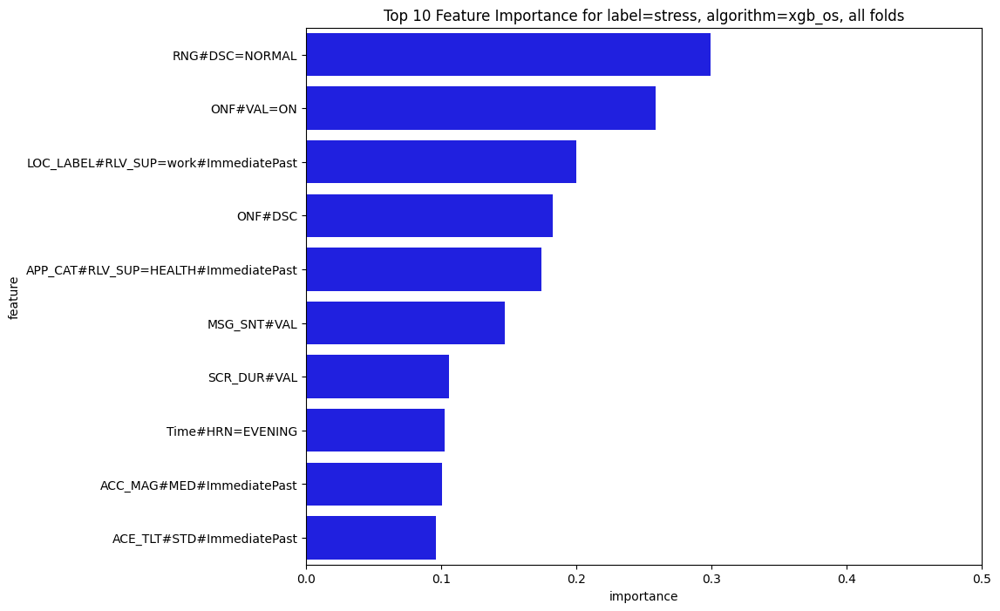

In [13]:
# Create a plot for each label and algorithm, aggregating all folds
for (l, alg), df in IMPORTANCE_SUMMARY_xgb_os.groupby(['label', 'alg']):
    # Aggregate the importance scores across folds and get top 10 features
    df_agg = df.groupby('feature')['importance'].mean().reset_index()
    df_agg_top10 = df_agg.sort_values(by='importance', ascending=False).head(10)

    plt.figure(figsize=(10,8))
    sns.barplot(data=df_agg_top10, x='importance', y='feature', color='b')
    plt.title(f'Top 10 Feature Importance for label={l}, algorithm={alg}, all folds')
    plt.xlim([0, 0.5])

    plt.show()

# Comparing High Performance Group and Low Performance Group

We already visualize individual feature importance and confusion matrix, but it is difficult to get meaningful insights from individual anlysis.
- As fo sensor (loso evaluation),
what is high performance and low performance (loso)?
    - We define high performance group as top 4 macro F1 score
    - We define low performance group as worst 4 macro F1 score

In [28]:
#Define what is high performance group and low performance group.
uid_low_performance =  RESULTS_xgbos[['split', 'test_f1_macro']].sort_values('test_f1_macro',ascending = True)[:4].split.values.tolist()
uid_high_performance = RESULTS_xgbos[['split', 'test_f1_macro']].sort_values('test_f1_macro',ascending = False)[:4].split.values.tolist()

In [29]:
IMPORTANCE_SUMMARY_xgb_os_high_performance = IMPORTANCE_SUMMARY_xgb_os.loc[IMPORTANCE_SUMMARY_xgb_os['fold'].isin(uid_high_performance)]
IMPORTANCE_SUMMARY_xgb_os_low_performance = IMPORTANCE_SUMMARY_xgb_os.loc[IMPORTANCE_SUMMARY_xgb_os['fold'].isin(uid_low_performance)]

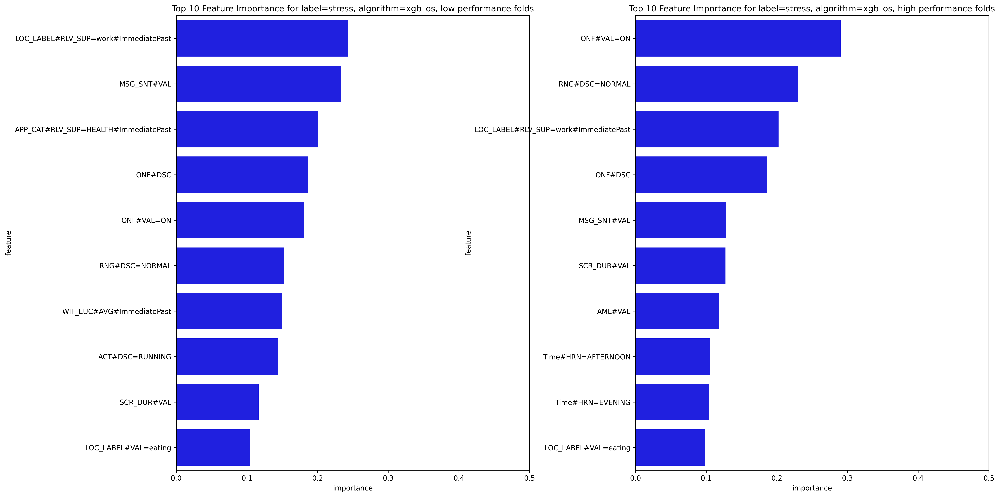

In [30]:
import matplotlib.pyplot as plt

fig, axs = plt.subplots(1, 2, figsize=(20, 10), dpi=300)

for (l, alg), df in IMPORTANCE_SUMMARY_xgb_os_low_performance.groupby(['label', 'alg']):
    # Aggregate the importance scores across folds and get top 10 features
    df_agg = df.groupby('feature')['importance'].mean().reset_index()
    df_agg_top10 = df_agg.sort_values(by='importance', ascending=False).head(10)

    sns.barplot(data=df_agg_top10, x='importance', y='feature', color='b', ax=axs[0])
    axs[0].set_title(f'Top 10 Feature Importance for label={l}, algorithm={alg}, low performance folds')
    axs[0].set_xlim([0, 0.5])

for (l, alg), df in IMPORTANCE_SUMMARY_xgb_os_high_performance.groupby(['label', 'alg']):
    # Aggregate the importance scores across folds and get top 10 features
    df_agg = df.groupby('feature')['importance'].mean().reset_index()
    df_agg_top10 = df_agg.sort_values(by='importance', ascending=False).head(10)

    sns.barplot(data=df_agg_top10, x='importance', y='feature', color='b', ax=axs[1])
    axs[1].set_title(f'Top 10 Feature Importance for label={l}, algorithm={alg}, high performance folds')
    axs[1].set_xlim([0, 0.5])

plt.tight_layout()
plt.subplots_adjust(wspace=0.3)
plt.show()


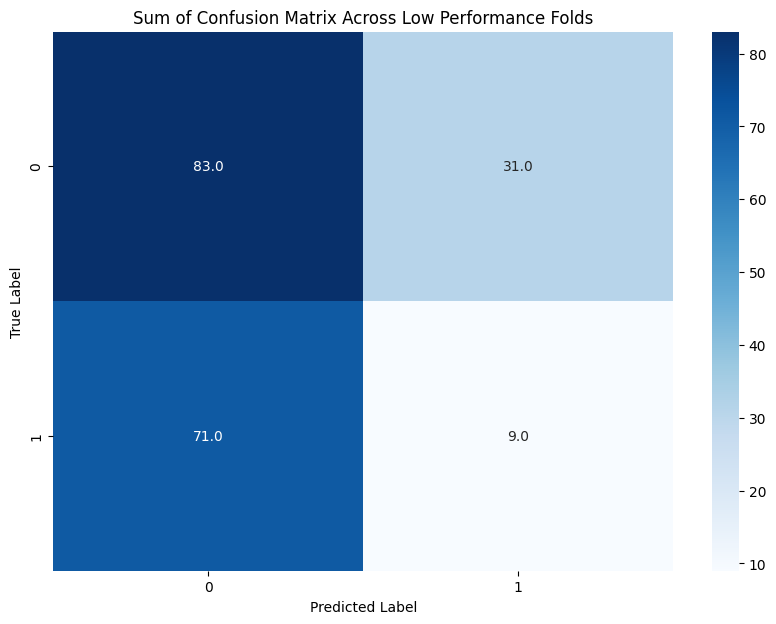

In [31]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

# Assuming `df` is your DataFrame
df_confusion_matrix = RESULTS_xgbos[RESULTS_xgbos['split'].isin(uid_low_performance)][['split', 'test_true_0_pred_0',
       'test_true_0_pred_1', 'test_true_1_pred_0', 'test_true_1_pred_1']].set_index('split')

# Calculate the mean of confusion matrix values across all folds
mean_confusion_matrix = df_confusion_matrix.sum()

# Convert the mean values into a 2x2 confusion matrix
matrix = mean_confusion_matrix.values.reshape(2, 2)

# Plot the averaged confusion matrix
plt.figure(figsize=(10, 7))
sns.heatmap(matrix, annot=True, fmt=".1f", cmap='Blues')
plt.title("Sum of Confusion Matrix Across Low Performance Folds")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

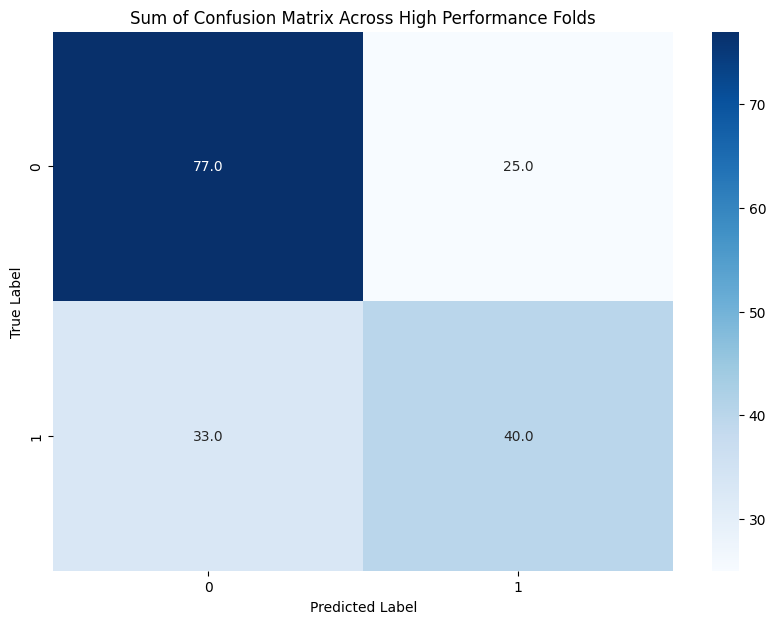

In [32]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

# Assuming `df` is your DataFrame
df_confusion_matrix = RESULTS_xgbos[RESULTS_xgbos['split'].isin(uid_high_performance)][['split', 'test_true_0_pred_0',
       'test_true_0_pred_1', 'test_true_1_pred_0', 'test_true_1_pred_1']].set_index('split')

# Calculate the mean of confusion matrix values across all folds
mean_confusion_matrix = df_confusion_matrix.sum()

# Convert the mean values into a 2x2 confusion matrix
matrix = mean_confusion_matrix.values.reshape(2, 2)

# Plot the averaged confusion matrix
plt.figure(figsize=(10, 7))
sns.heatmap(matrix, annot=True, fmt=".1f", cmap='Blues')
plt.title("Sum of Confusion Matrix Across High Performance Folds")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

# Label Value Time Series Visualization

In [34]:
LABELS_PROC = pd.read_csv(os.path.join(PATH_INTERMEDIATE, 'proc', 'LABELS_PROC.csv'), index_col=['pcode','timestamp'],parse_dates=True)

In [35]:
df = LABELS_PROC[['stress']].reset_index()

In [36]:
import pandas as pd
import plotly.graph_objects as go
import numpy as np


# Create a list of unique users
users = df['pcode'].unique()

# Create an empty list to store traces for each user, mean lines, and zero lines
traces = []

# Create a trace for each user's time series and calculate mean value for each user
for user in users:
    user_data = df[df['pcode'] == user]
    mean_value = user_data['stress'].mean()
    trace = go.Scatter(
        x=user_data['timestamp'],
        y=user_data['stress'],
        name=user,
        mode='markers+text',
        marker=dict(size=8, line=dict(width=1), color='blue'),
        text=user_data['stress'].astype(str),
        textposition='top center',
        textfont=dict(size=12)
    )
    traces.append(trace)
    mean_line = go.Scatter(
        x=user_data['timestamp'],
        y=[mean_value] * len(user_data['timestamp']),
        mode='lines',
        name=f'Mean ({user})'
    )
    traces.append(mean_line)
    zero_line = go.Scatter(
        x=user_data['timestamp'],
        y=[0] * len(user_data['timestamp']),
        mode='lines',
        name=f'Zero ({user})'
    )
    traces.append(zero_line)

# Create the layout for the plot
layout = go.Layout(
    title='Time Series Visualization',
    xaxis=dict(title='Timestamp'),
    yaxis=dict(title='Stress', range=[-4, 4])  # Set the desired range for the y-axis
)

# Create the figure with data and layout
fig = go.Figure(data=traces, layout=layout)

# Create the dropdown menu
buttons = []
for user in users:
    button = dict(
        label=user,
        method='update',
        args=[{'visible': [user in trace.name for trace in traces]}]
    )
    buttons.append(button)

updatemenus = list([
    dict(
        buttons=buttons,
        direction='down',
        active=0,
        showactive=True
    )
])

# Update the figure layout with the dropdown menu
fig.update_layout(updatemenus=updatemenus)

# Show the interactive plot
fig.show()


In [37]:
#The following code is designed for reordering for the sake of time series split
#################################################
df = LABELS_PROC[['stress']].reset_index()
# Normalize the datetime for each user
# df['datetime'] = df.groupby('user_id')['datetime'].transform(lambda x: x - x.min())
df['timestamp'] = df.groupby('pcode')['timestamp'].transform(lambda x: x - x.min().normalize())

# Sort the DataFrame by datetime
df = df.sort_values(by=[ 'timestamp'])
random_timestamp = pd.datetime(year=1970, month=1, day=1, hour=1)
df['timestamp'] = df['timestamp'] + random_timestamp

/tmp/ipykernel_367933/490817896.py:10: FutureWarning:

The pandas.datetime class is deprecated and will be removed from pandas in a future version. Import from datetime module instead.



In [38]:
import pandas as pd
import plotly.graph_objects as go
import numpy as np

# Create a list of unique users
users = df['pcode'].unique()

# Create an empty list to store traces for each user
traces = []

# Create a trace for each user's time series
for user in users:
    user_data = df[df['pcode'] == user]
    trace = go.Scatter(
        x=user_data['timestamp'],
        y=user_data['stress'],
        name=user,
        mode='markers+text',
        marker=dict(size=8, line=dict(width=1), color='blue'),
        text=user_data['stress'].astype(str),
        textposition='top center',
        textfont=dict(size=12)
    )
    traces.append(trace)

# Calculate the overall mean value for all users
mean_value = np.mean(df['stress'])

# Create traces for the mean value line and the horizontal line at 0 for all users
mean_line = go.Scatter(
    x=df['timestamp'],
    y=[mean_value] * len(df['timestamp']),
    mode='lines',
    name='Mean (All Users)'
)
zero_line = go.Scatter(
    x=df['timestamp'],
    y=[0] * len(df['timestamp']),
    mode='lines',
    name='Zero (All Users)'
)

traces.append(mean_line)
traces.append(zero_line)

# Create the layout for the plot
layout = go.Layout(
    title='Time Series Visualization',
    xaxis=dict(title='Timestamp'),
    yaxis=dict(title='Stress', range=[-4, 4])
)

# Create the figure with data and layout
fig = go.Figure(data=traces, layout=layout)

# Show the interactive plot
fig.show()

In [39]:
#The following code is designed for reordering for the sake of time series split
#################################################
df = LABELS_PROC[['stress']].reset_index()
df = df[df['pcode'].isin(uid_low_performance)]
# Normalize the datetime for each user
# df['datetime'] = df.groupby('user_id')['datetime'].transform(lambda x: x - x.min())
df['timestamp'] = df.groupby('pcode')['timestamp'].transform(lambda x: x - x.min().normalize())

# Sort the DataFrame by datetime
df = df.sort_values(by=[ 'timestamp'])
random_timestamp = pd.datetime(year=1970, month=1, day=1, hour=1)
df['timestamp'] = df['timestamp'] + random_timestamp

/tmp/ipykernel_367933/473884817.py:11: FutureWarning:

The pandas.datetime class is deprecated and will be removed from pandas in a future version. Import from datetime module instead.



In [40]:
import pandas as pd
import plotly.graph_objects as go
import numpy as np


# Create a list of unique users
users = df['pcode'].unique()

# Create an empty list to store traces for each user, mean lines, and zero lines
traces = []

# Create a trace for each user's time series and calculate mean value for each user
for user in users:
    user_data = df[df['pcode'] == user]
    mean_value = user_data['stress'].mean()
    trace = go.Scatter(
        x=user_data['timestamp'],
        y=user_data['stress'],
        name=user,
        mode='markers+text',
        marker=dict(size=8, line=dict(width=1), color='blue'),
        text=user_data['stress'].astype(str),
        textposition='top center',
        textfont=dict(size=12)
    )
    traces.append(trace)
    mean_line = go.Scatter(
        x=user_data['timestamp'],
        y=[mean_value] * len(user_data['timestamp']),
        mode='lines',
        name=f'Mean ({user})'
    )
    traces.append(mean_line)
    zero_line = go.Scatter(
        x=user_data['timestamp'],
        y=[0] * len(user_data['timestamp']),
        mode='lines',
        name=f'Zero ({user})'
    )
    traces.append(zero_line)

# Create the layout for the plot
layout = go.Layout(
    title='Time Series Visualization',
    xaxis=dict(title='Timestamp'),
    yaxis=dict(title='Stress', range=[-4, 4])  # Set the desired range for the y-axis
)

# Create the figure with data and layout
fig = go.Figure(data=traces, layout=layout)

# Create the dropdown menu
buttons = []
for user in users:
    button = dict(
        label=user,
        method='update',
        args=[{'visible': [user in trace.name for trace in traces]}]
    )
    buttons.append(button)

updatemenus = list([
    dict(
        buttons=buttons,
        direction='down',
        active=0,
        showactive=True
    )
])

# Update the figure layout with the dropdown menu
fig.update_layout(updatemenus=updatemenus)

# Show the interactive plot
fig.show()


In [41]:
import pandas as pd
import plotly.graph_objects as go
import numpy as np

# Create a list of unique users
users = df['pcode'].unique()

# Create an empty list to store traces for each user
traces = []

# Create a trace for each user's time series
for user in users:
    user_data = df[df['pcode'] == user]
    trace = go.Scatter(
        x=user_data['timestamp'],
        y=user_data['stress'],
        name=user,
        mode='markers+text',
        marker=dict(size=8, line=dict(width=1), color='blue'),
        text=user_data['stress'].astype(str),
        textposition='top center',
        textfont=dict(size=12)
    )
    traces.append(trace)

# Calculate the overall mean value for all users
mean_value = np.mean(df['stress'])

# Create traces for the mean value line and the horizontal line at 0 for all users
mean_line = go.Scatter(
    x=df['timestamp'],
    y=[mean_value] * len(df['timestamp']),
    mode='lines',
    name='Mean (All Users)'
)
zero_line = go.Scatter(
    x=df['timestamp'],
    y=[0] * len(df['timestamp']),
    mode='lines',
    name='Zero (All Users)'
)

traces.append(mean_line)
traces.append(zero_line)

# Create the layout for the plot
layout = go.Layout(
    title='Time Series Visualization',
    xaxis=dict(title='Timestamp'),
    yaxis=dict(title='Stress', range=[-4, 4])
)

# Create the figure with data and layout
fig = go.Figure(data=traces, layout=layout)

# Show the interactive plot
fig.show()

In [42]:
#The following code is designed for reordering for the sake of time series split
#################################################
df = LABELS_PROC[['stress']].reset_index()
df = df[df['pcode'].isin(uid_high_performance)]
# Normalize the datetime for each user
# df['datetime'] = df.groupby('user_id')['datetime'].transform(lambda x: x - x.min())
df['timestamp'] = df.groupby('pcode')['timestamp'].transform(lambda x: x - x.min().normalize())

# Sort the DataFrame by datetime
df = df.sort_values(by=[ 'timestamp'])
random_timestamp = pd.datetime(year=1970, month=1, day=1, hour=1)
df['timestamp'] = df['timestamp'] + random_timestamp

/tmp/ipykernel_367933/988886537.py:11: FutureWarning:

The pandas.datetime class is deprecated and will be removed from pandas in a future version. Import from datetime module instead.



In [43]:
import pandas as pd
import plotly.graph_objects as go
import numpy as np


# Create a list of unique users
users = df['pcode'].unique()

# Create an empty list to store traces for each user, mean lines, and zero lines
traces = []

# Create a trace for each user's time series and calculate mean value for each user
for user in users:
    user_data = df[df['pcode'] == user]
    mean_value = user_data['stress'].mean()
    trace = go.Scatter(
        x=user_data['timestamp'],
        y=user_data['stress'],
        name=user,
        mode='markers+text',
        marker=dict(size=8, line=dict(width=1), color='blue'),
        text=user_data['stress'].astype(str),
        textposition='top center',
        textfont=dict(size=12)
    )
    traces.append(trace)
    mean_line = go.Scatter(
        x=user_data['timestamp'],
        y=[mean_value] * len(user_data['timestamp']),
        mode='lines',
        name=f'Mean ({user})'
    )
    traces.append(mean_line)
    zero_line = go.Scatter(
        x=user_data['timestamp'],
        y=[0] * len(user_data['timestamp']),
        mode='lines',
        name=f'Zero ({user})'
    )
    traces.append(zero_line)

# Create the layout for the plot
layout = go.Layout(
    title='Time Series Visualization',
    xaxis=dict(title='Timestamp'),
    yaxis=dict(title='Stress', range=[-4, 4])  # Set the desired range for the y-axis
)

# Create the figure with data and layout
fig = go.Figure(data=traces, layout=layout)

# Create the dropdown menu
buttons = []
for user in users:
    button = dict(
        label=user,
        method='update',
        args=[{'visible': [user in trace.name for trace in traces]}]
    )
    buttons.append(button)

updatemenus = list([
    dict(
        buttons=buttons,
        direction='down',
        active=0,
        showactive=True
    )
])

# Update the figure layout with the dropdown menu
fig.update_layout(updatemenus=updatemenus)

# Show the interactive plot
fig.show()


In [44]:
import pandas as pd
import plotly.graph_objects as go
import numpy as np

# Create a list of unique users
users = df['pcode'].unique()

# Create an empty list to store traces for each user
traces = []

# Create a trace for each user's time series
for user in users:
    user_data = df[df['pcode'] == user]
    trace = go.Scatter(
        x=user_data['timestamp'],
        y=user_data['stress'],
        name=user,
        mode='markers+text',
        marker=dict(size=8, line=dict(width=1), color='blue'),
        text=user_data['stress'].astype(str),
        textposition='top center',
        textfont=dict(size=12)
    )
    traces.append(trace)

# Calculate the overall mean value for all users
mean_value = np.mean(df['stress'])

# Create traces for the mean value line and the horizontal line at 0 for all users
mean_line = go.Scatter(
    x=df['timestamp'],
    y=[mean_value] * len(df['timestamp']),
    mode='lines',
    name='Mean (All Users)'
)
zero_line = go.Scatter(
    x=df['timestamp'],
    y=[0] * len(df['timestamp']),
    mode='lines',
    name='Zero (All Users)'
)

traces.append(mean_line)
traces.append(zero_line)

# Create the layout for the plot
layout = go.Layout(
    title='Time Series Visualization For High Performance Users',
    xaxis=dict(title='Timestamp'),
    yaxis=dict(title='Stress', range=[-4, 4])
)

# Create the figure with data and layout
fig = go.Figure(data=traces, layout=layout)

# Show the interactive plot
fig.show()